### References
- https://arxiv.org/pdf/1805.08318

In [3]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import v2 as T
from torchvision.transforms.functional import convert_image_dtype
import torchvision.utils as vutils
import random
from tqdm import tqdm
from torch.nn.utils import spectral_norm
from torch.utils.data.dataset import random_split
from torchmetrics.image.fid import FrechetInceptionDistance

In [4]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
BATCH_SIZE = 64
NZ = 256                    # Размер векторра шума z
NGF = 32                    # Размер модификатора каналов в генераторе
NDF = 32                    # Размер модификатора каналов в дискриминаторе
NC = 3                      # Количество каналов в изображении
BETA_1, BETA_2 = 0, 0.9     # B1, B2 коэффициенты оптимизатора
CLASS_N = 11                # Количество классов в датасете
K = 8                       # Множитель уменьшения количества каналов в слое self-attention

In [5]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [6]:
class SelfAttention(nn.Module):
    def __init__(self, input):
        super().__init__()
        self.f = nn.Conv2d(input, input // K, 1)
        self.g = nn.Conv2d(input, input // K, 1)
        self.h = nn.Conv2d(input, input // K, 1)
        self.v = nn.Conv2d(input // K, input, 1)
        self.softmax = nn.Softmax(dim=-1)
        self.gamma = nn.Parameter(torch.zeros(1))

    def forward(self, x):
        batch, channels, width, height = x.shape
        f = self.f(x).view(batch, -1, width * height)                   # BxCxWxH -> BxCxN | N(W*H)
        f = torch.transpose(f, 1, 2)                                    # BxCxN -> BxNxC
        g = self.g(x).view(batch, -1, width * height)                   # BxCxWxH -> BxCxN
        h = self.h(x).view(batch, -1, width * height)                   # BxCxWxH -> BxCxN
        attention = self.softmax(torch.bmm(f, g))                       # BxNxC x BxCxN -> BxNxN
        attention = torch.bmm(h, attention)                             # BxCxN x BxNxN -> BxCxN
        attention = attention.view(batch, channels // K, width, height) # BxCxN -> BxCxWxH
        o = self.v(attention)
        out = x + o * self.gamma
        return out

In [7]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1 = nn.Sequential(
            # NZ
            spectral_norm(nn.ConvTranspose2d(NZ, NGF * 8, 8, 1, 0, bias=False)),
            nn.BatchNorm2d(NGF * 8),
            nn.ReLU(True),
        )
        self.l2 = nn.Sequential(
            # ngf*8 x 8 x 8 
            spectral_norm(nn.ConvTranspose2d(NGF * 8, NGF * 4, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NGF * 4),
            nn.ReLU(True),
        )
        self.l3 = nn.Sequential(
            # ngf*4 x 16 x 16
            spectral_norm(nn.ConvTranspose2d(NGF * 4, NGF * 2, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NGF * 2),
            nn.ReLU(True),
        )
        self.l4 = nn.Sequential(
            # ngf*2 x 32 x 32
            spectral_norm(nn.ConvTranspose2d(NGF * 2, NGF , 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NGF),
            nn.ReLU(True)
        )
        self.l5 = nn.Sequential(
            # ngf x 64 x 64
            nn.ConvTranspose2d(NGF, NC, 4, 2, 1, bias=False),
            nn.Tanh(),
        )
        self.att = SelfAttention(NGF* 8)

    def forward(self, x, rnd=0.005):
        x = self.l1(x)
        x = self.att(x)
        x = self.l2(x)
        x = self.l3(x)
        x = self.l4(x)
        x = self.l5(x)
        noise = (rnd**0.5)*torch.randn(x.shape, device=DEVICE).detach()
        return x + noise

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1 = nn.Sequential(
            # nc x 128 x 128
            spectral_norm(nn.Conv2d(NC, NDF, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.l2 = nn.Sequential(
            # ndf x 64 x 64
            spectral_norm(nn.Conv2d(NDF, NDF * 2, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF * 2),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.l3 = nn.Sequential(
            # ndf*2 x 32 x 32
            spectral_norm(nn.Conv2d(NDF * 2, NDF * 4, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF * 4),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.l4 = nn.Sequential(
            # ndf*4 x 16 x 16
            spectral_norm(nn.Conv2d(NDF * 4, NDF * 8, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(NDF * 8),
            nn.LeakyReLU(0.2, inplace=True),
        )
        self.image_classification = nn.Sequential(
            nn.Conv2d(NDF * 8, CLASS_N, 8, 1, 0, bias=False),
            nn.Sigmoid()
        )
        self.fake_classification = nn.Sequential(
            nn.Conv2d(NDF * 8, 1, 8, 1, 0, bias=False),
        )
        self.att = SelfAttention(NDF*8)

    def forward(self, x):
        x = self.l1(x)
        x = self.l2(x)
        x = self.l3(x)
        x = self.l4(x)
        x = self.att(x)
        fake = self.fake_classification(x)
        label = self.image_classification(x)
        return fake, label

In [8]:
def train(models, data_loader: DataLoader, optimizers: tuple, class_loss_fn, rnd=0.005):
    D, G = models
    G.train()
    D.train()

    d_optim, g_optim = optimizers
    train_d_loss, train_g_loss = 0, 0

    for real_img, class_label in data_loader:
        real_img, class_label = real_img.to(DEVICE), class_label.to(DEVICE)
        batch_size = real_img.size(0)

        fake_img = G(torch.randn(batch_size, NZ, 1, 1, device=DEVICE), rnd)

        # добавляем шум в входные данные
        real_img = real_img + (rnd**0.5)*torch.randn(real_img.shape, device=DEVICE).detach()
       
        # тренируем дискриминатор
        d_optim.zero_grad()
        # реальные изображения
        true_outs, label = D(real_img)
        d_real_loss = torch.nn.ReLU()(1.0 - true_outs).mean()
        d_real_loss = d_real_loss + class_loss_fn(label.squeeze(2, 3), class_label)
        d_real_loss.backward()

        # фейковые изображения
        fake_outs, _ = D(fake_img.detach())
        d_fake_loss = torch.nn.ReLU()(1.0 + fake_outs).mean()
        d_fake_loss.backward()  
        d_optim.step()
        
        # тренируем генератор
        g_optim.zero_grad()
        fake_outs_, _ = D(fake_img)
        g_loss = -fake_outs_.mean()
        g_loss.backward()
        g_optim.step()

        train_d_loss += (d_real_loss + d_fake_loss).item()
        train_g_loss += g_loss.item()

    train_g_loss /= len(data_loader)
    train_d_loss /= len(data_loader)

    return train_d_loss, train_g_loss

In [9]:
@torch.no_grad()
def rescale(tensor):
    tensor -= tensor.min() 
    tensor /= tensor.max() 
    return tensor

@torch.no_grad()
def eval(model, data_loader, fid):
    G = model
    G.to(DEVICE)
    G.eval()

    for real_img, _ in data_loader:
        real_img = real_img.to(DEVICE)
        batch_size = real_img.size(0)
        fake_img = G(torch.randn(batch_size, NZ, 1, 1, device=DEVICE))

        fid.update(convert_image_dtype(rescale(real_img), torch.uint8), real=True)
        fid.update(convert_image_dtype(rescale(fake_img), torch.uint8), real=False)

    score = fid.compute()
    fid.reset()
    return score

In [10]:
image_dataset = ImageFolder(
    root='D:\\repositories\\ml\\test\\DL\\GAN\\planets',
    transform=T.Compose([
        T.Resize(128),
        T.ToTensor(),
        T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]))

train_data , eval_data = random_split(image_dataset, (int(len(image_dataset) * 0.8), len(image_dataset) - int(len(image_dataset) * 0.8)))
data_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
eval_data_loader = torch.utils.data.DataLoader(eval_data, batch_size=BATCH_SIZE, shuffle=True)

In [11]:
G = Generator()
D = Discriminator()

G.apply(weights_init)
D.apply(weights_init)

G.to(DEVICE)
D.to(DEVICE)

g_optim = torch.optim.Adam(G.parameters(), lr=2e-4, betas=(BETA_1, BETA_2))
d_optim = torch.optim.Adam(D.parameters(), lr=6e-4, betas=(BETA_1, BETA_2))
class_loss_fn = nn.CrossEntropyLoss()
fid = FrechetInceptionDistance(feature=2048, reset_real_features=False).to(DEVICE)

In [12]:
fix_noise = torch.randn(16, NZ, 1, 1, device=DEVICE)


def plot_examples(title=None):
    G.eval()
    D.eval()

    plt.figure(figsize=(10, 4))
    images = G(fix_noise)

    plt.imshow(np.transpose(vutils.make_grid(images.cpu(), padding=5, normalize=True), (1, 2, 0)))
    if title:
        plt.title(title)
    plt.show()

epoch:1, d loss:2.811212612522973, g loss:8.271615410844484, fid:400.0571594238281
epoch:2, d loss:2.5903808143403797, g loss:9.614857671989334, fid:384.86590576171875
epoch:3, d loss:2.563653220733007, g loss:9.36370837688446, fid:378.9596862792969
epoch:4, d loss:2.010168241129981, g loss:9.641861081123352, fid:348.551025390625
epoch:5, d loss:2.9980822470453052, g loss:7.880531578635176, fid:290.7685241699219
epoch:6, d loss:2.7093297806051044, g loss:6.466698922423853, fid:299.3904113769531
epoch:7, d loss:3.1021383570300207, g loss:5.565938893291685, fid:285.45458984375
epoch:8, d loss:3.2208231687545776, g loss:5.152479604300526, fid:265.1172790527344
epoch:9, d loss:3.431952436765035, g loss:4.236255245697167, fid:253.3248291015625
epoch:10, d loss:3.559297740459442, g loss:3.491697391288148, fid:253.8327178955078
epoch:11, d loss:3.3664170503616333, g loss:2.9469171739700766, fid:240.22250366210938
epoch:12, d loss:3.332378718588087, g loss:3.0171096698484487, fid:241.509292602

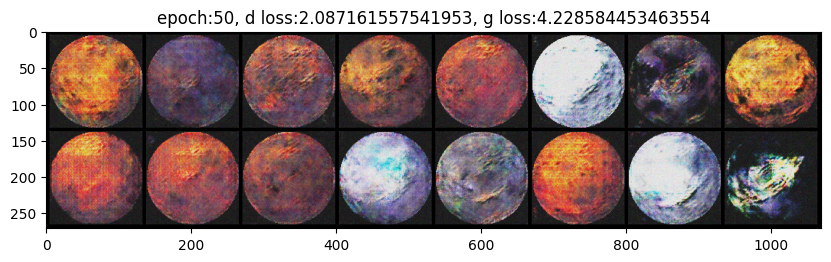

epoch:51, d loss:2.0152048766613007, g loss:4.198802643352085, fid:215.93829345703125
epoch:52, d loss:2.1465286910533905, g loss:4.3184224391976995, fid:213.69061279296875
epoch:53, d loss:2.0820432835155063, g loss:4.201287514633602, fid:216.1595458984375
epoch:54, d loss:2.0720638069841595, g loss:4.572773635387421, fid:212.54808044433594
epoch:55, d loss:1.9861864182684157, g loss:4.344913974404335, fid:215.8765869140625
epoch:56, d loss:2.175092819664213, g loss:4.389895906878842, fid:213.51873779296875
epoch:57, d loss:2.001423292689853, g loss:4.243291572978099, fid:226.4208526611328
epoch:58, d loss:2.0069294472535453, g loss:4.422690716054705, fid:218.7491455078125
epoch:59, d loss:2.089099198579788, g loss:4.219861250784662, fid:210.60153198242188
epoch:60, d loss:2.0012395216359034, g loss:4.363460587130652, fid:211.2016143798828
epoch:61, d loss:1.9886119299464755, g loss:4.417415820890003, fid:213.36984252929688
epoch:62, d loss:2.075927048921585, g loss:4.241920681049426,

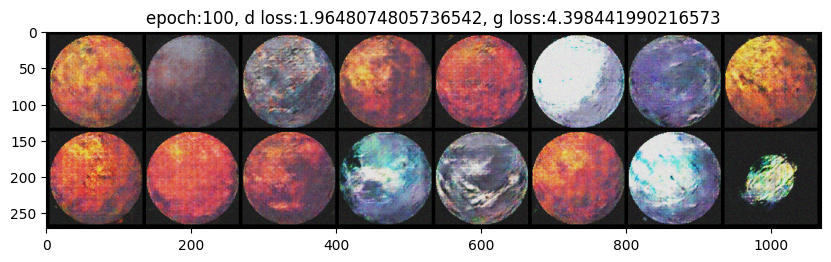

epoch:101, d loss:1.9769174986415439, g loss:4.196637401978175, fid:190.35784912109375
epoch:102, d loss:1.9142421318425074, g loss:4.368207977877723, fid:198.59359741210938
epoch:103, d loss:1.8990663687388103, g loss:4.4748513499895735, fid:197.50196838378906
epoch:104, d loss:1.8730209403567843, g loss:4.366192327605353, fid:196.32310485839844
epoch:105, d loss:1.8569193217489455, g loss:4.433967288997438, fid:201.9134063720703
epoch:106, d loss:1.9479768806033664, g loss:4.392585929897097, fid:193.36032104492188
epoch:107, d loss:1.8953816360897489, g loss:4.50330427620146, fid:191.5818634033203
epoch:108, d loss:1.9353698227140639, g loss:4.385517001152039, fid:189.7349395751953
epoch:109, d loss:1.8893902169333563, g loss:4.223108775085873, fid:199.9691925048828
epoch:110, d loss:1.8752577205499013, g loss:4.5160817636383905, fid:195.9604949951172
epoch:111, d loss:1.971175836192237, g loss:4.392604632510079, fid:195.44300842285156
epoch:112, d loss:1.9128716720475092, g loss:4.2

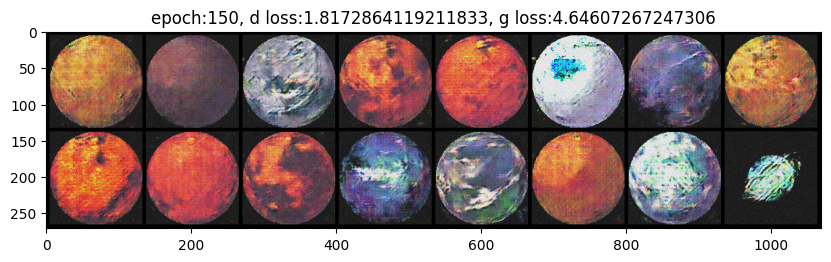

epoch:151, d loss:1.8336754772398207, g loss:4.486993233362834, fid:188.78045654296875
epoch:152, d loss:1.8604355620013342, g loss:4.411882672044966, fid:185.96334838867188
epoch:153, d loss:1.8302111526330311, g loss:4.400154378679064, fid:182.1964874267578
epoch:154, d loss:1.8279984262254503, g loss:4.478131870428721, fid:192.03823852539062
epoch:155, d loss:1.8904056151707966, g loss:4.494872308439678, fid:191.99891662597656
epoch:156, d loss:1.9005829128954146, g loss:4.539994183513853, fid:185.07241821289062
epoch:157, d loss:1.803349021408293, g loss:4.405897289514542, fid:188.83306884765625
epoch:158, d loss:1.8847487303945754, g loss:4.412790311707391, fid:186.04684448242188
epoch:159, d loss:1.9172126783265009, g loss:4.527586228317684, fid:185.7947235107422
epoch:160, d loss:1.833476013607449, g loss:4.3891212873988685, fid:182.34930419921875
epoch:161, d loss:1.8245860470665827, g loss:4.450986741317643, fid:182.87095642089844
epoch:162, d loss:1.8502520024776459, g loss:4

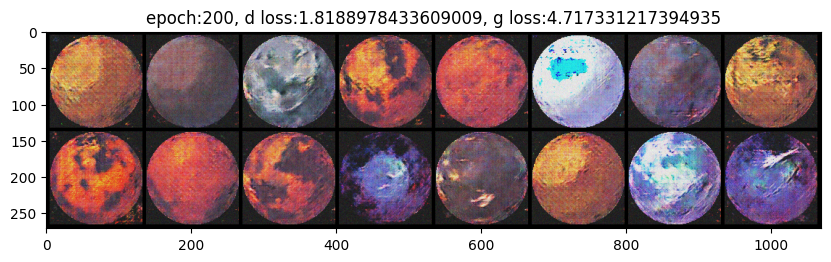

epoch:201, d loss:1.7538613577683766, g loss:4.626686188909742, fid:185.77691650390625
epoch:202, d loss:1.8039710124333699, g loss:4.606728520658281, fid:175.99990844726562
epoch:203, d loss:1.7922233475579157, g loss:4.612280991342333, fid:183.4232635498047
epoch:204, d loss:1.8352881504429712, g loss:4.7044282754262285, fid:176.81829833984375
epoch:205, d loss:1.7885598142941792, g loss:4.582296987374623, fid:180.64260864257812
epoch:206, d loss:1.809833632575141, g loss:4.7256538073221845, fid:185.5751495361328
epoch:207, d loss:1.7763863801956177, g loss:4.566592534383138, fid:183.77610778808594
epoch:208, d loss:1.8614468905660841, g loss:4.725650787353516, fid:187.45179748535156
epoch:209, d loss:1.8258231812053256, g loss:4.48784633146392, fid:180.63223266601562
epoch:210, d loss:1.817541178729799, g loss:4.457840455902947, fid:182.8603057861328
epoch:211, d loss:1.8030265503459506, g loss:4.687512073251936, fid:180.7797393798828
epoch:212, d loss:1.782579974995719, g loss:4.70

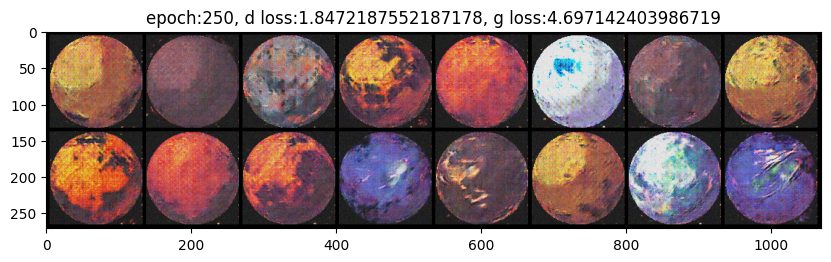

epoch:251, d loss:1.7417587637901306, g loss:4.856306884023878, fid:174.88955688476562
epoch:252, d loss:1.7987555960814159, g loss:4.878036121527354, fid:178.78724670410156
epoch:253, d loss:1.7914361159006755, g loss:4.8283765647146435, fid:172.67965698242188
epoch:254, d loss:1.7633477250734966, g loss:4.780215524964863, fid:174.63990783691406
epoch:255, d loss:1.8622032072809007, g loss:4.832743081781599, fid:172.9256134033203
epoch:256, d loss:1.7710319956143696, g loss:4.8074397047360735, fid:181.217529296875
epoch:257, d loss:1.7753310137324863, g loss:4.778141286638048, fid:176.98280334472656
epoch:258, d loss:1.7699805597464244, g loss:4.722860674063365, fid:171.38223266601562
epoch:259, d loss:1.722954812977049, g loss:4.905008263058132, fid:173.69630432128906
epoch:260, d loss:1.7599053117964003, g loss:4.974386758274502, fid:176.0572052001953
epoch:261, d loss:1.8076028658284082, g loss:4.852598435348934, fid:182.70948791503906
epoch:262, d loss:1.7484844393200345, g loss:4

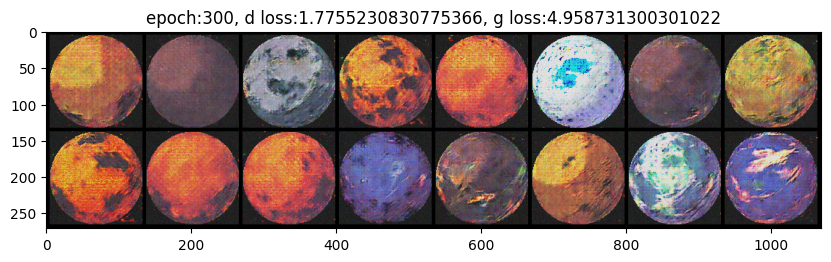

epoch:301, d loss:1.7480831676059299, g loss:5.162029971679051, fid:168.14134216308594
epoch:302, d loss:1.742738942305247, g loss:5.094571623537275, fid:179.1110076904297
epoch:303, d loss:1.7738343477249146, g loss:4.844369924730724, fid:171.94468688964844
epoch:304, d loss:1.75618158115281, g loss:5.025267829497655, fid:170.06483459472656
epoch:305, d loss:1.776834163400862, g loss:5.025815225309795, fid:178.3458709716797
epoch:306, d loss:1.8020427889294095, g loss:4.760596523682277, fid:177.09457397460938
epoch:307, d loss:1.7725788321759965, g loss:5.022437393665314, fid:172.34307861328125
epoch:308, d loss:1.7848408453994327, g loss:5.13423153758049, fid:171.59347534179688
epoch:309, d loss:1.7802361581060622, g loss:4.93037278453509, fid:167.59278869628906
epoch:310, d loss:1.724354538652632, g loss:4.859253307183583, fid:170.23756408691406
epoch:311, d loss:1.7416258189413283, g loss:5.065501107109918, fid:172.13250732421875
epoch:312, d loss:1.7562931213113997, g loss:5.04095

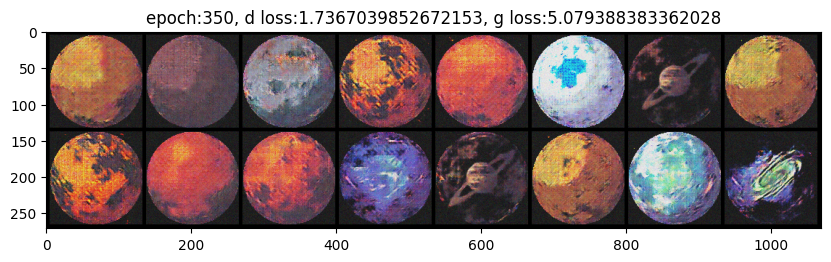

epoch:351, d loss:1.7560527722040813, g loss:4.90554545323054, fid:168.49273681640625
epoch:352, d loss:1.7680519819259644, g loss:5.039028896225823, fid:169.12269592285156
epoch:353, d loss:1.6982953084839716, g loss:4.980963945388794, fid:165.63430786132812
epoch:354, d loss:1.7272834248012967, g loss:5.124892003006405, fid:172.09024047851562
epoch:355, d loss:1.7768302890989516, g loss:5.143356647756365, fid:167.61526489257812
epoch:356, d loss:1.7517259981897142, g loss:5.061505486567815, fid:175.88050842285156
epoch:357, d loss:1.7083268264929454, g loss:5.120941632323795, fid:169.99005126953125
epoch:358, d loss:1.7648075487878587, g loss:5.102913075023228, fid:170.9174041748047
epoch:359, d loss:1.7629359828101263, g loss:5.161798450681898, fid:170.9842529296875
epoch:360, d loss:1.7520006497701008, g loss:4.9390397485759525, fid:168.4389190673828
epoch:361, d loss:1.7031855185826619, g loss:4.859042598141564, fid:171.68983459472656
epoch:362, d loss:1.7187166677580938, g loss:4

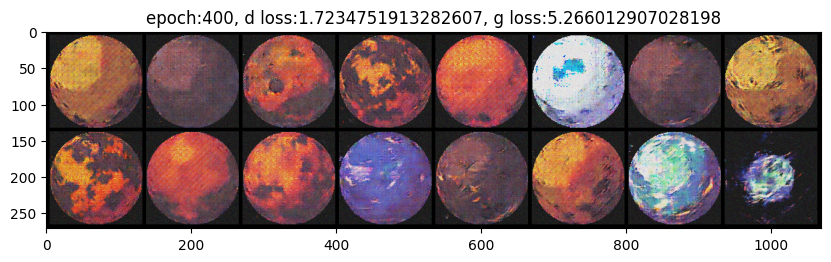

epoch:401, d loss:1.710387173626158, g loss:5.401812725596958, fid:164.65444946289062
epoch:402, d loss:1.7192225058873494, g loss:5.206642634338802, fid:166.39578247070312
epoch:403, d loss:1.7092008425129785, g loss:5.401858958933088, fid:175.64898681640625
epoch:404, d loss:1.7388182878494263, g loss:5.341412941614787, fid:174.52825927734375
epoch:405, d loss:1.7561049958070118, g loss:5.285294284423192, fid:172.1217803955078
epoch:406, d loss:1.705673161480162, g loss:5.461541540092892, fid:168.47335815429688
epoch:407, d loss:1.6999468008677165, g loss:5.256319708294338, fid:173.234130859375
epoch:408, d loss:1.7340946396191914, g loss:5.207018362151252, fid:168.36663818359375
epoch:409, d loss:1.7185676991939545, g loss:5.412450022167629, fid:170.54129028320312
epoch:410, d loss:1.7253812816407945, g loss:5.461087700393465, fid:165.3890380859375
epoch:411, d loss:1.7093465361330245, g loss:5.269898891448975, fid:166.7561492919922
epoch:412, d loss:1.7543292575412326, g loss:5.187

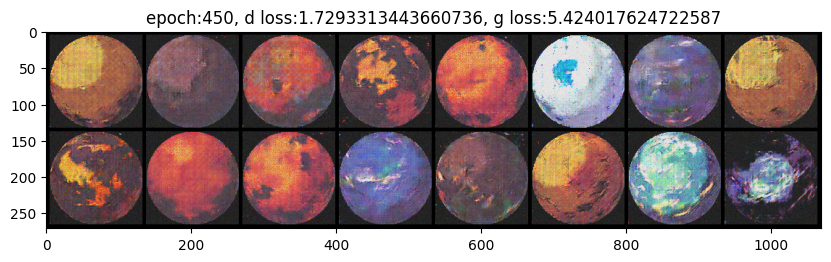

epoch:451, d loss:1.716336237059699, g loss:5.281141297684775, fid:168.72972106933594
epoch:452, d loss:1.7058199180497065, g loss:5.444234553310606, fid:166.56243896484375
epoch:453, d loss:1.7020297050476074, g loss:5.497059159808689, fid:163.14088439941406
epoch:454, d loss:1.713874767223994, g loss:5.45350456237793, fid:173.2554931640625
epoch:455, d loss:1.7144470877117581, g loss:5.499313794904285, fid:174.65878295898438
epoch:456, d loss:1.7182369199064043, g loss:5.3101828296979265, fid:168.52699279785156
epoch:457, d loss:1.6760006844997406, g loss:5.24164256784651, fid:167.16294860839844
epoch:458, d loss:1.7513148089249928, g loss:5.448106302155389, fid:178.14996337890625
epoch:459, d loss:1.6959821714295282, g loss:5.451402717166477, fid:169.72613525390625
epoch:460, d loss:1.6616659528679318, g loss:5.510869277848138, fid:171.07699584960938
epoch:461, d loss:1.6915456387731764, g loss:5.623551693227556, fid:171.7238006591797
epoch:462, d loss:1.707389040125741, g loss:5.46

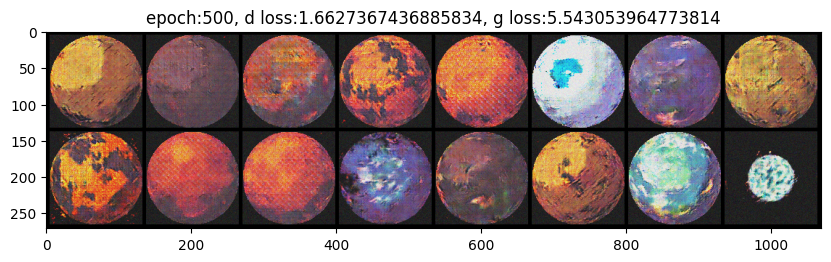

epoch:501, d loss:1.7174398766623602, g loss:5.5122455557187395, fid:173.0946807861328
epoch:502, d loss:1.684519304169549, g loss:5.5380984677208795, fid:167.79281616210938
epoch:503, d loss:1.6983487473593817, g loss:5.483444134394328, fid:172.03842163085938
epoch:504, d loss:1.7040419379870098, g loss:5.441024872991774, fid:171.2833251953125
epoch:505, d loss:1.689851850271225, g loss:5.4824714925554066, fid:163.58993530273438
epoch:506, d loss:1.7259947425789304, g loss:5.490446362230513, fid:166.80360412597656
epoch:507, d loss:1.6772824492719438, g loss:5.473577307330237, fid:169.61746215820312
epoch:508, d loss:1.7008077568478055, g loss:5.386555406782362, fid:170.0645294189453
epoch:509, d loss:1.672220465209749, g loss:5.481745421886444, fid:169.0088348388672
epoch:510, d loss:1.7465132408671908, g loss:5.6960799429151745, fid:168.47601318359375
epoch:511, d loss:1.7049037284321256, g loss:5.660501095983717, fid:170.7643280029297
epoch:512, d loss:1.6766320566336315, g loss:5.

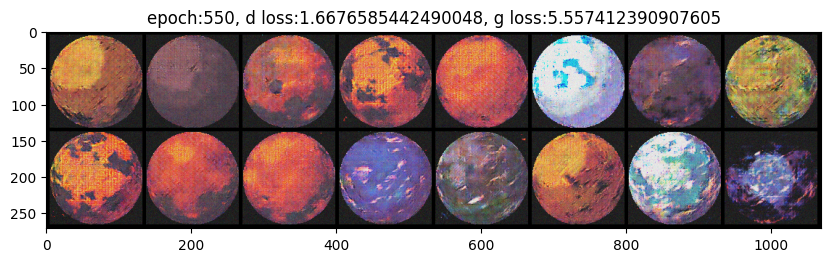

epoch:551, d loss:1.6847617626190186, g loss:5.443055066797468, fid:166.92625427246094
epoch:552, d loss:1.6573975185553234, g loss:5.6615188055568275, fid:167.1792755126953
epoch:553, d loss:1.6779839032226138, g loss:5.804364396466149, fid:170.3114776611328
epoch:554, d loss:1.7002844611803691, g loss:5.480960574414995, fid:166.22402954101562
epoch:555, d loss:1.7175785998503368, g loss:5.545495430628459, fid:165.91136169433594
epoch:556, d loss:1.67356566256947, g loss:5.601610097620222, fid:164.22821044921875
epoch:557, d loss:1.6847741074032254, g loss:5.533392475710975, fid:164.6661376953125
epoch:558, d loss:1.68382418817944, g loss:5.621722545888689, fid:158.78738403320312
epoch:559, d loss:1.6896071367793613, g loss:5.498349183135563, fid:165.79713439941406
epoch:560, d loss:1.6803160475360022, g loss:5.749879750940535, fid:174.6442108154297
epoch:561, d loss:1.7307081487443712, g loss:5.635274748007457, fid:168.87271118164062
epoch:562, d loss:1.64633333351877, g loss:5.34836

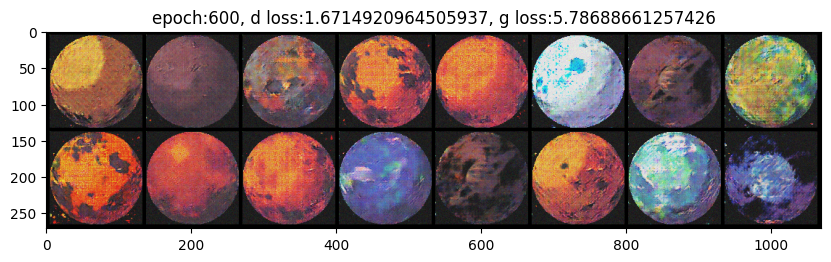

epoch:601, d loss:1.6980439225832622, g loss:5.518491526444753, fid:168.6332244873047
epoch:602, d loss:1.6681703792677984, g loss:5.800775037871467, fid:163.41616821289062
epoch:603, d loss:1.6932457553015814, g loss:5.792614638805389, fid:168.82598876953125
epoch:604, d loss:1.6762486861811743, g loss:5.566840208239025, fid:174.9439697265625
epoch:605, d loss:1.6231153077549405, g loss:5.678889208369785, fid:170.06504821777344
epoch:606, d loss:1.6652926339043512, g loss:6.17573305633333, fid:163.5245819091797
epoch:607, d loss:1.6970960630310907, g loss:5.972094164954291, fid:171.5016326904297
epoch:608, d loss:1.6624444160196516, g loss:5.821099592579736, fid:169.8853759765625
epoch:609, d loss:1.6631290912628174, g loss:5.876701864931318, fid:169.46749877929688
epoch:610, d loss:1.660431017478307, g loss:5.913374324639638, fid:174.31532287597656
epoch:611, d loss:1.726393418179618, g loss:6.053331520822313, fid:166.70262145996094
epoch:612, d loss:1.6408595244089763, g loss:6.0095

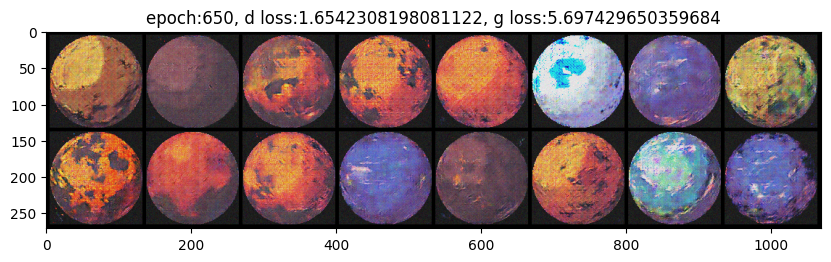

epoch:651, d loss:1.6610814332962036, g loss:6.1403632627593145, fid:169.88070678710938
epoch:652, d loss:1.6694423854351044, g loss:5.722662621074253, fid:165.1227264404297
epoch:653, d loss:1.6673827800485823, g loss:5.83458720975452, fid:164.8626251220703
epoch:654, d loss:1.6819528573089175, g loss:5.898658931255341, fid:162.46717834472656
epoch:655, d loss:1.6397417783737183, g loss:5.877521614233653, fid:156.72254943847656
epoch:656, d loss:1.7040040360556707, g loss:5.871020456155141, fid:162.80165100097656
epoch:657, d loss:1.6273879706859589, g loss:6.053653127617306, fid:165.70584106445312
epoch:658, d loss:1.658008383380042, g loss:6.0097080734041, fid:162.45281982421875
epoch:659, d loss:1.697987887594435, g loss:5.8538732926050825, fid:162.9661102294922
epoch:660, d loss:1.6592857274744246, g loss:5.976213289631738, fid:167.9844512939453
epoch:661, d loss:1.6853962110148535, g loss:5.948746042119132, fid:165.84268188476562
epoch:662, d loss:1.679132964875963, g loss:6.0913

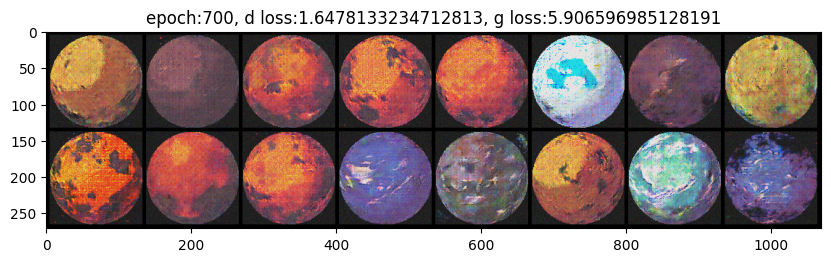

epoch:701, d loss:1.6877250439590878, g loss:6.1959736877017555, fid:165.01161193847656
epoch:702, d loss:1.650933133231269, g loss:5.929331812593672, fid:167.87374877929688
epoch:703, d loss:1.6703690091768901, g loss:5.998122036457062, fid:159.31509399414062
epoch:704, d loss:1.6452834374374814, g loss:6.176391608185238, fid:164.2469482421875
epoch:705, d loss:1.6466052300400205, g loss:5.988849467701382, fid:163.906982421875
epoch:706, d loss:1.6671555240948994, g loss:6.0348169803619385, fid:169.37420654296875
epoch:707, d loss:1.6653213202953339, g loss:5.909434040387471, fid:164.3826141357422
epoch:708, d loss:1.6553581588798099, g loss:5.82504219479031, fid:165.6507568359375
epoch:709, d loss:1.6487300660875108, g loss:6.020632916026646, fid:164.55364990234375
epoch:710, d loss:1.667210770977868, g loss:6.181747059027354, fid:168.6804656982422
epoch:711, d loss:1.6404645012484655, g loss:5.868078576193915, fid:171.95140075683594
epoch:712, d loss:1.6685434447394476, g loss:6.030

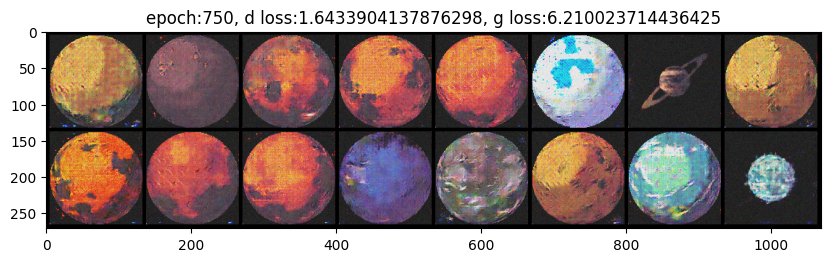

epoch:751, d loss:1.6367759936385684, g loss:6.214935693475935, fid:165.59921264648438
epoch:752, d loss:1.7007600035932329, g loss:6.168842408392164, fid:164.03082275390625
epoch:753, d loss:1.6190897391902075, g loss:6.216190662648943, fid:166.52166748046875
epoch:754, d loss:1.696890417072508, g loss:6.3010313510894775, fid:164.12872314453125
epoch:755, d loss:1.64211857981152, g loss:6.313940988646613, fid:159.69171142578125
epoch:756, d loss:1.7093011836210887, g loss:6.202485779921214, fid:165.6420440673828
epoch:757, d loss:1.6105404131942325, g loss:6.063800315062205, fid:160.33694458007812
epoch:758, d loss:1.6340529587533739, g loss:6.198664817545149, fid:164.4291229248047
epoch:759, d loss:1.625335156917572, g loss:6.195834636688232, fid:166.38497924804688
epoch:760, d loss:1.6299931903680165, g loss:5.913108375337389, fid:160.61724853515625
epoch:761, d loss:1.6958558691872492, g loss:6.054642564720577, fid:162.50669860839844
epoch:762, d loss:1.6729363401730855, g loss:5.9

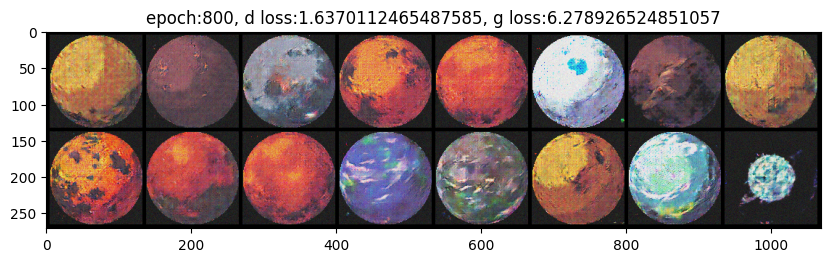

epoch:801, d loss:1.6114686959319644, g loss:6.3206640349494085, fid:160.53799438476562
epoch:802, d loss:1.700239486164517, g loss:6.343422856595781, fid:165.90625
epoch:803, d loss:1.632005638546414, g loss:6.317730347315471, fid:168.34170532226562
epoch:804, d loss:1.653736902607812, g loss:6.488878687222798, fid:167.5441131591797
epoch:805, d loss:1.6621506479051378, g loss:6.4037744005521136, fid:166.56533813476562
epoch:806, d loss:1.6649690336651273, g loss:6.682712038358052, fid:166.53933715820312
epoch:807, d loss:1.690959953599506, g loss:6.269712852107154, fid:167.3859405517578
epoch:808, d loss:1.628844486342536, g loss:6.260011268986596, fid:170.0400848388672
epoch:809, d loss:1.630348480410046, g loss:6.427874909506904, fid:173.7525634765625
epoch:810, d loss:1.631523824400372, g loss:6.258876244227092, fid:163.29092407226562
epoch:811, d loss:1.644341939025455, g loss:6.187318093246883, fid:161.77403259277344
epoch:812, d loss:1.633167992035548, g loss:6.3653984268506365

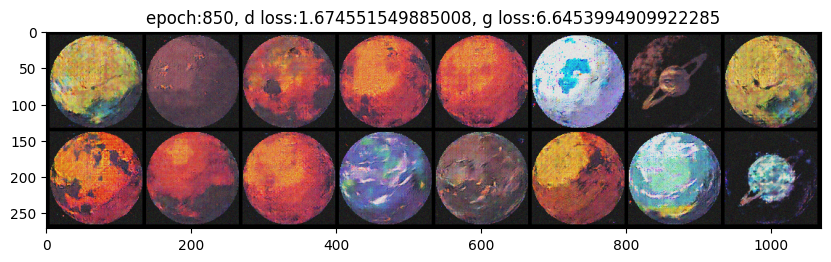

epoch:851, d loss:1.633350862397088, g loss:6.513238191604614, fid:157.43661499023438
epoch:852, d loss:1.6150453090667725, g loss:6.469329337279002, fid:160.5384521484375
epoch:853, d loss:1.6475826700528462, g loss:6.2994899021254644, fid:162.177978515625
epoch:854, d loss:1.6654381222195096, g loss:6.23324003484514, fid:161.1986541748047
epoch:855, d loss:1.648413489262263, g loss:6.472442514366573, fid:161.43478393554688
epoch:856, d loss:1.632909466822942, g loss:6.376085215144688, fid:159.1171875
epoch:857, d loss:1.6478378938304052, g loss:6.474788619412316, fid:161.48875427246094
epoch:858, d loss:1.6241996785004933, g loss:6.391668015056187, fid:161.52468872070312
epoch:859, d loss:1.6393360296885173, g loss:6.371912770801121, fid:157.35641479492188
epoch:860, d loss:1.6163859069347382, g loss:6.447298440668318, fid:160.8280792236328
epoch:861, d loss:1.654537753926383, g loss:6.366137941678365, fid:163.01126098632812
epoch:862, d loss:1.6420657568507724, g loss:6.536441942056

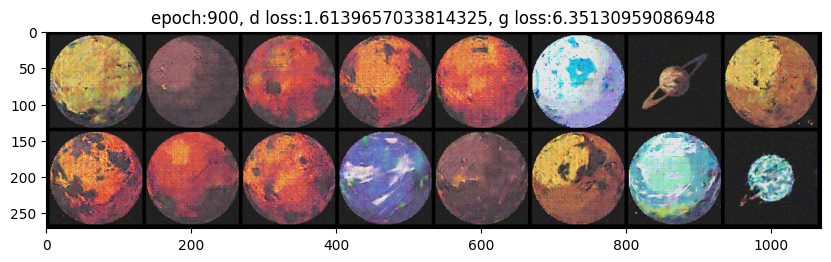

epoch:901, d loss:1.6580102741718292, g loss:6.4067076444625854, fid:163.35545349121094
epoch:902, d loss:1.6192400289906397, g loss:6.610486480924818, fid:164.8896484375
epoch:903, d loss:1.6359225345982447, g loss:6.369143446286519, fid:164.5367889404297
epoch:904, d loss:1.6671319438351526, g loss:6.340175479650497, fid:164.67076110839844
epoch:905, d loss:1.615356230073505, g loss:6.310199459393819, fid:162.7691650390625
epoch:906, d loss:1.622478210263782, g loss:6.39202340443929, fid:162.03826904296875
epoch:907, d loss:1.6728021403153737, g loss:6.286619014210171, fid:160.24205017089844
epoch:908, d loss:1.612026313940684, g loss:6.379829221301609, fid:160.3561553955078
epoch:909, d loss:1.6469619108570948, g loss:6.369207898775737, fid:165.7036590576172
epoch:910, d loss:1.6429971721437242, g loss:6.56509589486652, fid:159.32269287109375
epoch:911, d loss:1.6525235142972734, g loss:6.4271288183000355, fid:157.50819396972656
epoch:912, d loss:1.640108240975274, g loss:6.57059989

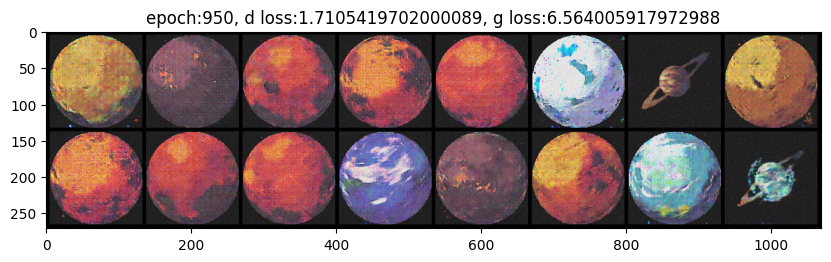

epoch:951, d loss:1.618961254755656, g loss:6.518727686670092, fid:170.02442932128906
epoch:952, d loss:1.6004129085275862, g loss:6.63813845316569, fid:172.383056640625
epoch:953, d loss:1.6656225191222296, g loss:6.5732890367507935, fid:161.79969787597656
epoch:954, d loss:1.5804295473628573, g loss:6.392288671599494, fid:167.2415008544922
epoch:955, d loss:1.6237930489910974, g loss:6.50718793604109, fid:159.9829864501953
epoch:956, d loss:1.6342185073428683, g loss:6.622817907068464, fid:167.18365478515625
epoch:957, d loss:1.6106117003493838, g loss:6.459914154476589, fid:164.84666442871094
epoch:958, d loss:1.6796755128436618, g loss:6.954462514983283, fid:161.82518005371094
epoch:959, d loss:1.6548776361677382, g loss:6.508652541372511, fid:161.7234649658203
epoch:960, d loss:1.60838203297721, g loss:6.498363508118524, fid:164.18698120117188
epoch:961, d loss:1.639060053560469, g loss:6.715254737271203, fid:161.75314331054688
epoch:962, d loss:1.6650789810551538, g loss:6.511416

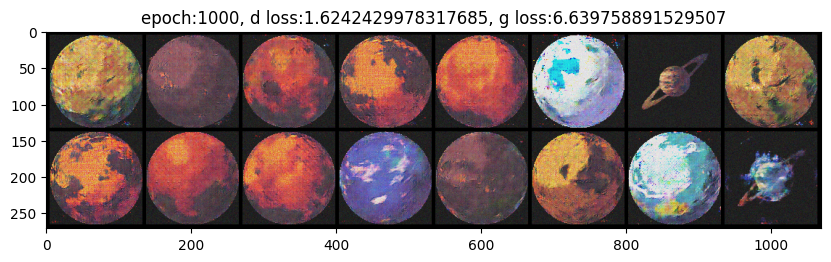

epoch:1001, d loss:1.6027414268917508, g loss:6.81242118941413, fid:162.5062255859375
epoch:1002, d loss:1.6330160233709548, g loss:6.713767455683814, fid:166.62271118164062
epoch:1003, d loss:1.6293773419327207, g loss:6.62144582801395, fid:161.55018615722656
epoch:1004, d loss:1.628284990787506, g loss:6.3125611080063715, fid:163.2292022705078
epoch:1005, d loss:1.6599881847699482, g loss:6.710962037245433, fid:166.74990844726562
epoch:1006, d loss:1.6556760768095653, g loss:6.95572194788191, fid:161.38967895507812
epoch:1007, d loss:1.6273643341329362, g loss:6.426427682240804, fid:171.37501525878906
epoch:1008, d loss:1.6030516260200076, g loss:6.9170711570315895, fid:164.42095947265625
epoch:1009, d loss:1.6328166259659662, g loss:6.6083294914828405, fid:165.569091796875
epoch:1010, d loss:1.6174194713433583, g loss:6.652377009391785, fid:167.6993408203125
epoch:1011, d loss:1.6402461263868544, g loss:6.7891718414094715, fid:166.724365234375
epoch:1012, d loss:1.613778422276179, g

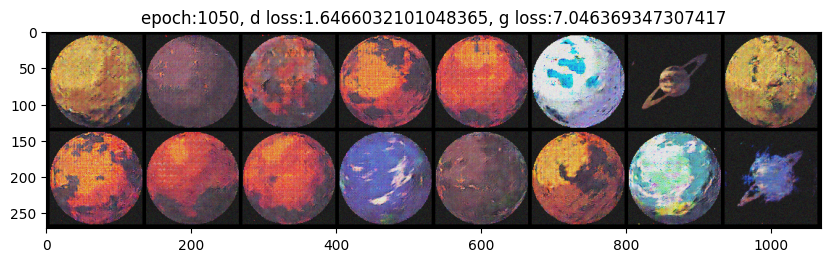

epoch:1051, d loss:1.6088787880208757, g loss:6.6944923003514605, fid:163.0139923095703
epoch:1052, d loss:1.6162662870354123, g loss:6.965884513325161, fid:161.26751708984375
epoch:1053, d loss:1.5966753231154547, g loss:6.92402117782169, fid:161.5677947998047
epoch:1054, d loss:1.6428307725323572, g loss:6.731438179810842, fid:162.34764099121094
epoch:1055, d loss:1.5998642610179052, g loss:7.066133790545994, fid:161.54583740234375
epoch:1056, d loss:1.6063199010160234, g loss:6.694032483630711, fid:159.9567108154297
epoch:1057, d loss:1.6082406573825412, g loss:6.816318333148956, fid:160.45118713378906
epoch:1058, d loss:1.6414935953087277, g loss:6.866289661990272, fid:159.015869140625
epoch:1059, d loss:1.6268405980534024, g loss:6.4593964682685, fid:157.2442169189453
epoch:1060, d loss:1.61826111541854, g loss:6.849762194686466, fid:155.72605895996094
epoch:1061, d loss:1.6200517581568823, g loss:6.613300906287299, fid:153.4593963623047
epoch:1062, d loss:1.6702878541416593, g lo

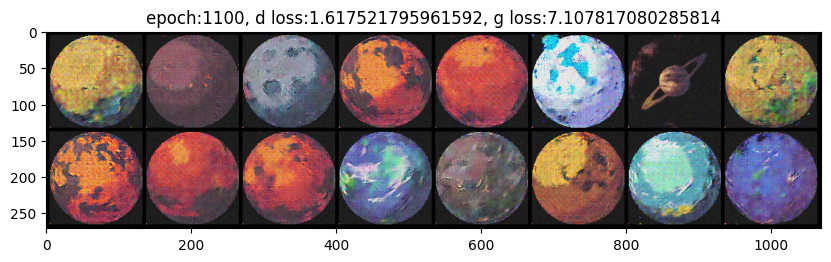

epoch:1101, d loss:1.6322607000668843, g loss:7.03022923734453, fid:158.0391387939453
epoch:1102, d loss:1.6056448287434049, g loss:7.296100709173414, fid:155.15415954589844
epoch:1103, d loss:1.6074847049183316, g loss:7.13736887772878, fid:156.40216064453125
epoch:1104, d loss:1.6628668506940205, g loss:6.865853759977552, fid:152.9849395751953
epoch:1105, d loss:1.6481268405914307, g loss:7.157102240456475, fid:158.4591522216797
epoch:1106, d loss:1.6116898357868195, g loss:7.118549042277866, fid:157.98020935058594
epoch:1107, d loss:1.5849682754940457, g loss:7.110603332519531, fid:158.24229431152344
epoch:1108, d loss:1.5959856543276045, g loss:6.886326597796546, fid:157.04698181152344
epoch:1109, d loss:1.6350570850902133, g loss:6.542506800757514, fid:156.51104736328125
epoch:1110, d loss:1.6293129755391016, g loss:6.906176686286926, fid:156.09156799316406
epoch:1111, d loss:1.6015658775965373, g loss:6.782755215962728, fid:161.7766876220703
epoch:1112, d loss:1.5973447130786047,

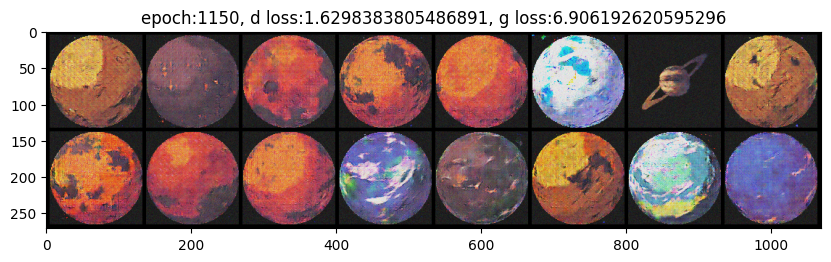

epoch:1151, d loss:1.6215999954276614, g loss:7.182143568992615, fid:163.61927795410156
epoch:1152, d loss:1.6259592407279544, g loss:7.036861982610491, fid:159.95423889160156
epoch:1153, d loss:1.5910773873329163, g loss:6.857148859235975, fid:160.30360412597656
epoch:1154, d loss:1.6186717715528276, g loss:6.715996033615536, fid:161.0552215576172
epoch:1155, d loss:1.6033625536494784, g loss:7.063295470343696, fid:164.02413940429688
epoch:1156, d loss:1.6311284767256842, g loss:7.232217755582598, fid:160.19268798828125
epoch:1157, d loss:1.627624425623152, g loss:6.9605524275037975, fid:163.83499145507812
epoch:1158, d loss:1.610265639093187, g loss:7.309122482935588, fid:158.20936584472656
epoch:1159, d loss:1.6334495378865137, g loss:7.202910357051426, fid:156.5962677001953
epoch:1160, d loss:1.634007304906845, g loss:7.047318776448567, fid:154.82806396484375
epoch:1161, d loss:1.593226472536723, g loss:6.996143115891351, fid:157.79544067382812
epoch:1162, d loss:1.6174147327740986

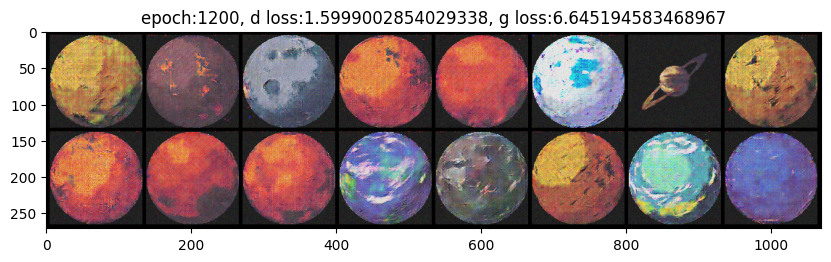

epoch:1201, d loss:1.6269187033176422, g loss:7.069088432523939, fid:156.37596130371094
epoch:1202, d loss:1.6120078497462802, g loss:6.9234274758232965, fid:152.8546600341797
epoch:1203, d loss:1.6348528166611989, g loss:6.703065507941776, fid:149.4073028564453
epoch:1204, d loss:1.5790358516905043, g loss:6.838231431113349, fid:154.13177490234375
epoch:1205, d loss:1.6300911439789667, g loss:7.363369358910455, fid:158.6368865966797
epoch:1206, d loss:1.604382769929038, g loss:7.377059863673316, fid:157.5867156982422
epoch:1207, d loss:1.6077032089233398, g loss:7.418292926417457, fid:159.45899963378906
epoch:1208, d loss:1.6173798475000594, g loss:7.2497398191028175, fid:155.43673706054688
epoch:1209, d loss:1.6187790499793158, g loss:7.345978332890405, fid:154.96957397460938
epoch:1210, d loss:1.6209416157669492, g loss:7.120052456855774, fid:151.9044647216797
epoch:1211, d loss:1.6014669173293643, g loss:7.342045360141331, fid:156.31936645507812
epoch:1212, d loss:1.590729912122090

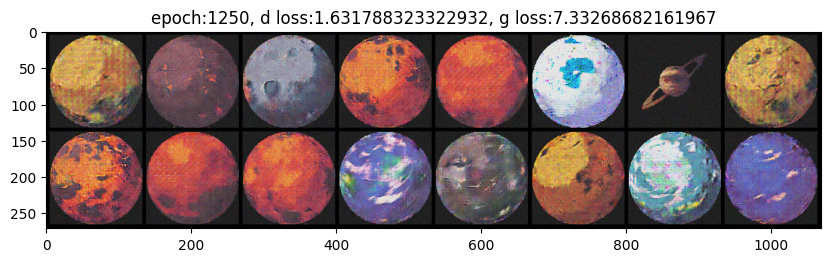

epoch:1251, d loss:1.5905914472209082, g loss:7.37790044148763, fid:166.04037475585938
epoch:1252, d loss:1.6218695044517517, g loss:7.470729125870599, fid:158.9188995361328
epoch:1253, d loss:1.6018464830186632, g loss:7.446532871988085, fid:161.8572235107422
epoch:1254, d loss:1.6767807205518086, g loss:7.215208881431156, fid:162.99476623535156
epoch:1255, d loss:1.586295270257526, g loss:7.361142582363552, fid:162.23716735839844
epoch:1256, d loss:1.5957450966040294, g loss:6.9600158664915295, fid:157.83558654785156
epoch:1257, d loss:1.6476875907844968, g loss:7.2618850866953535, fid:159.68299865722656
epoch:1258, d loss:1.6167435414261289, g loss:7.19835588004854, fid:164.215087890625
epoch:1259, d loss:1.618767453564538, g loss:7.13691125313441, fid:163.88421630859375
epoch:1260, d loss:1.6014526320828333, g loss:7.111854871114095, fid:163.033447265625
epoch:1261, d loss:1.612258513768514, g loss:7.3953836758931475, fid:163.54017639160156
epoch:1262, d loss:1.6184227764606476, g 

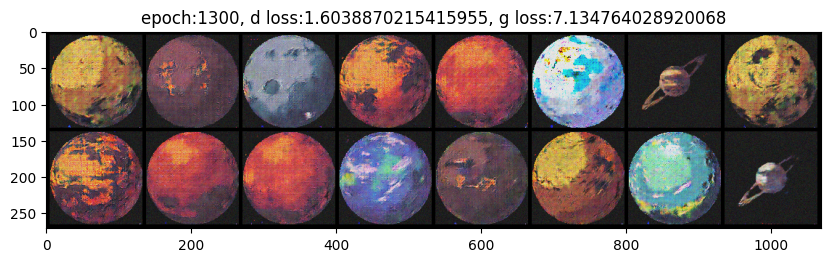

epoch:1301, d loss:1.614245398177041, g loss:7.330134563975864, fid:154.30868530273438
epoch:1302, d loss:1.582097527053621, g loss:7.2299486133787365, fid:164.33555603027344
epoch:1303, d loss:1.5878749820921156, g loss:7.1150303681691485, fid:155.89710998535156
epoch:1304, d loss:1.6496735745006137, g loss:7.261060701476203, fid:156.94232177734375
epoch:1305, d loss:1.6726415985160403, g loss:7.081235263082716, fid:158.9613494873047
epoch:1306, d loss:1.5863537589708965, g loss:6.838748481538561, fid:157.0274200439453
epoch:1307, d loss:1.6280717551708221, g loss:7.002895553906758, fid:157.44808959960938
epoch:1308, d loss:1.5955547988414764, g loss:7.240883716278606, fid:159.86105346679688
epoch:1309, d loss:1.6155153281158872, g loss:7.16467301050822, fid:160.96275329589844
epoch:1310, d loss:1.6111424267292023, g loss:7.320110996564229, fid:158.42562866210938
epoch:1311, d loss:1.6373945110374026, g loss:7.144421653615104, fid:155.64720153808594
epoch:1312, d loss:1.61839276883337

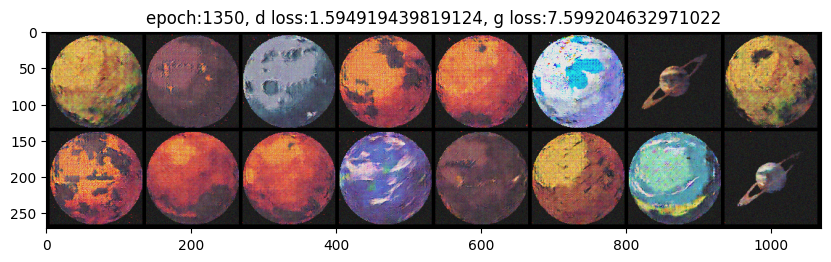

epoch:1351, d loss:1.6288954416910808, g loss:7.561801950136821, fid:160.319091796875
epoch:1352, d loss:1.6311487290594313, g loss:7.3663385311762495, fid:155.91334533691406
epoch:1353, d loss:1.592091030544705, g loss:7.741762200991313, fid:160.23471069335938
epoch:1354, d loss:1.5775782134797838, g loss:7.198824809657203, fid:158.05076599121094
epoch:1355, d loss:1.665523048904207, g loss:7.7521005339092675, fid:158.14114379882812
epoch:1356, d loss:1.5757177869478862, g loss:7.301913579305013, fid:157.4997100830078
epoch:1357, d loss:1.615513328048918, g loss:7.301862703429328, fid:153.06019592285156
epoch:1358, d loss:1.6162463062339358, g loss:7.32738819387224, fid:154.2755126953125
epoch:1359, d loss:1.5908700691329107, g loss:7.073622670438555, fid:153.7965850830078
epoch:1360, d loss:1.6002395583523645, g loss:7.445360329416063, fid:158.44158935546875
epoch:1361, d loss:1.614478326506085, g loss:6.997091240353054, fid:155.81031799316406
epoch:1362, d loss:1.5923474960856967, g

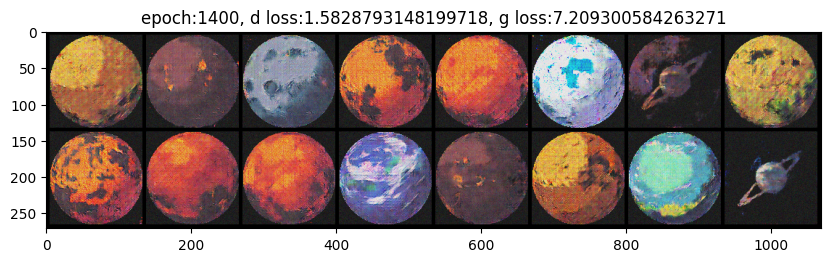

epoch:1401, d loss:1.6612947947449155, g loss:7.330274668004778, fid:154.6180877685547
epoch:1402, d loss:1.5980399350325267, g loss:7.2704528835084705, fid:156.10116577148438
epoch:1403, d loss:1.6215664943059285, g loss:7.130264322997795, fid:159.5653076171875
epoch:1404, d loss:1.6371718380186293, g loss:7.421207838588291, fid:160.83302307128906
epoch:1405, d loss:1.5907608899805281, g loss:7.578801419999865, fid:157.03536987304688
epoch:1406, d loss:1.5917403267489538, g loss:7.754987902111477, fid:156.33761596679688
epoch:1407, d loss:1.6701515515645344, g loss:7.507855421966976, fid:161.50140380859375
epoch:1408, d loss:1.5957175592581432, g loss:7.283334036668141, fid:158.3247833251953
epoch:1409, d loss:1.6236459049913619, g loss:7.384388044476509, fid:156.37911987304688
epoch:1410, d loss:1.6300382481680975, g loss:7.554837544759114, fid:153.4254608154297
epoch:1411, d loss:1.5935568544599745, g loss:7.345194697380066, fid:154.88507080078125
epoch:1412, d loss:1.62673959467146

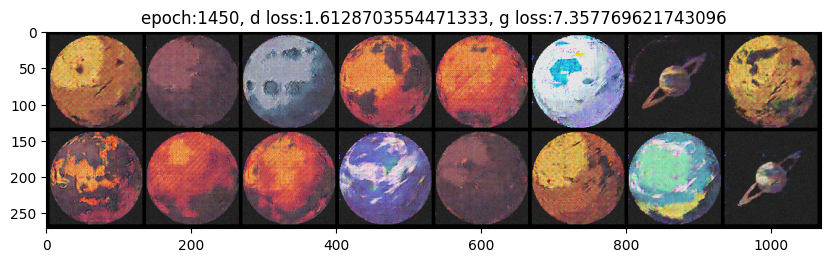

epoch:1451, d loss:1.6259327563974593, g loss:7.363487760225932, fid:153.57485961914062
epoch:1452, d loss:1.5778732630941603, g loss:7.233510388268365, fid:151.8004608154297
epoch:1453, d loss:1.6339016358057659, g loss:7.659712400701311, fid:156.1757049560547
epoch:1454, d loss:1.5752231379350026, g loss:7.496300061543782, fid:152.56826782226562
epoch:1455, d loss:1.6098655263582866, g loss:7.672716776529948, fid:159.38490295410156
epoch:1456, d loss:1.5934383538034227, g loss:7.086194435755412, fid:158.696044921875
epoch:1457, d loss:1.615969522131814, g loss:7.641856677002377, fid:159.31964111328125
epoch:1458, d loss:1.625236256255044, g loss:7.3695400555928545, fid:164.4675750732422
epoch:1459, d loss:1.608112825287713, g loss:7.423822581768036, fid:157.805908203125
epoch:1460, d loss:1.6282636092768774, g loss:7.3949081103007, fid:161.09014892578125
epoch:1461, d loss:1.6022128297222986, g loss:7.331307192643483, fid:162.11782836914062
epoch:1462, d loss:1.6029573612742953, g lo

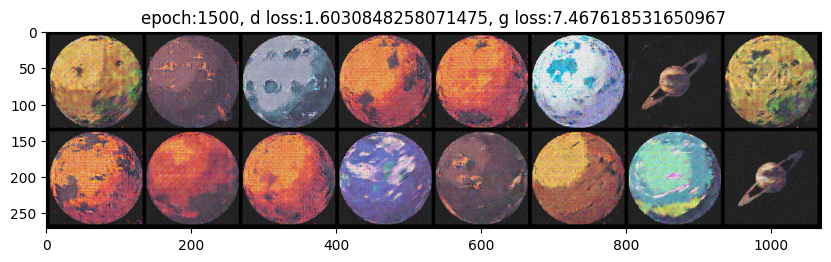

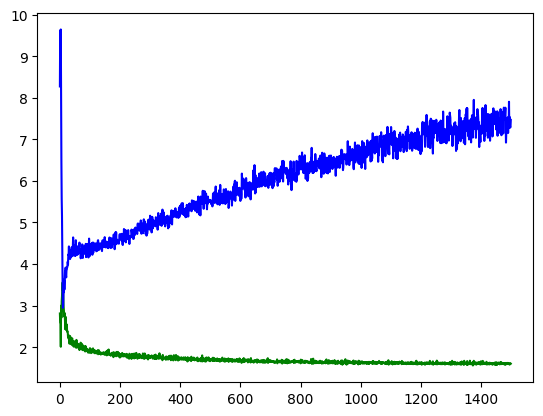

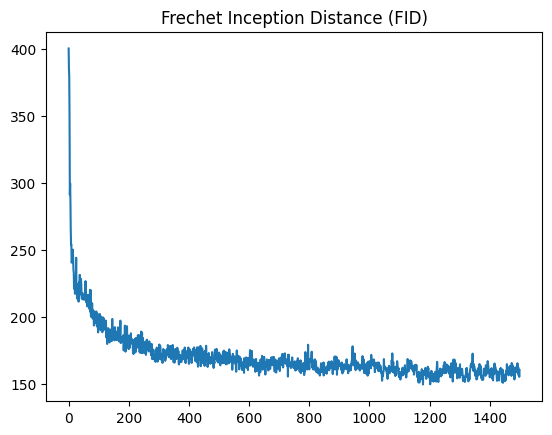

In [ ]:
all_d_loss, all_g_loss, all_fid_score = [], [], []

rnd = random.uniform(0, 0.5)
for e in range(1, 1501):
    d_loss, g_loss= train((D, G), data_loader, (d_optim, g_optim), class_loss_fn, rnd)
    all_d_loss.append(d_loss)
    all_g_loss.append(g_loss)

    fid_score = eval(G, eval_data_loader, fid)
    all_fid_score.append(fid_score.cpu())

    print(f'epoch:{e}, d loss:{d_loss}, g loss:{g_loss}, fid:{fid_score}')
    if e % 50 == 0:
        plot_examples(f'epoch:{e}, d loss:{d_loss}, g loss:{g_loss}')

plt.plot(all_d_loss, color='green')
plt.plot(all_g_loss, color='blue')
plt.show()

plt.plot(all_fid_score)
plt.title('Frechet Inception Distance (FID)')
plt.show()

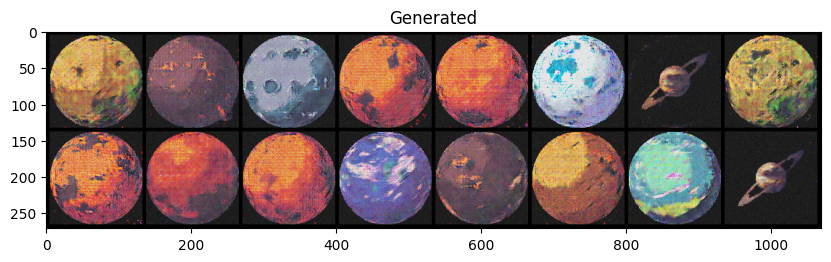

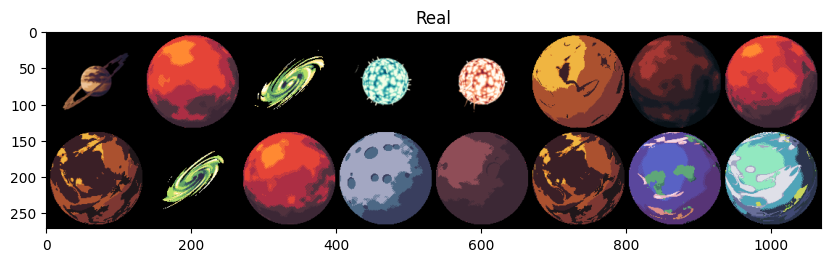

In [ ]:
plot_examples('Generated')
plt.figure(figsize=(10, 4))
plt.imshow(np.transpose(vutils.make_grid(next(iter(data_loader))[0][:16], padding=5, normalize=True), (1, 2, 0)))
plt.title('Real')
plt.show()